# 기본적인 기계 학습 알고리즘을 활용한 음악 장르 분류

이 문제지에서는 다양한 장르의 음악이 담긴 오디오 데이터를 사용해서 음악 장르의 분류를 수행하는 기계 학습 알고리즘을 만들어볼 것입니다. 문제지는 크게 3단계로 이루어져 있는데요. 먼저 오디오 데이터가 벡터로 수치화되는 방법을 살펴볼 것입니다. 그 다음으로 음원 장르 분류라는 목적에 맞게 오디오 데이터에서 특징값feature들을 추출하는 다양한 방법을 배울 것입니다. 문제지의 마지막에서는 추출된 특징값들을 바탕으로 음악 장르를 분류하는 기계학습 모델을 만들 것입니다. 이 과정들을 배운 후에 여러분에게 주어질 최종 과제는 다양한 방법들을 사용해서 모델의 정확도를 높이는 것입니다. 이 과정은 google colab에서 바로 작동할 수 있도록 만들어졌습니다.

## 1. 데이터셋 다운로드
GTZAN은 음악 분류를 위한 데이터 세트로서 30초 길이의 오디오 파일 1000개로 이루어져 있습니다. 오디오들은 10개의 음악 장르로 나뉘어져 있으며 각각의 장르는 100개의 오디오 트랙으로 구성되어 있습니다. 트랙은 모두 .wav 형식이며 샘플링 주파수sampling frequency는 22050Hz이고 아웃풋 채널은 mono 이며, bit depth는 16 bit인 형태입니다.
* [GTZAN Dataset - Music Genre Classification 데이터셋 저장소](https://github.com/clayryu/GTZAN-Dataset---Music-Genre-Classification/tree/main)
    * 참고: [원본 Kaggle 데이터셋 링크](https://www.kaggle.com/datasets/andradaolteanu/gtzan-dataset-music-genre-classification)

* 다음의 명령어를 이용해 데이터셋을 다운로드할 수 있습니다.

In [1]:
# 깃허브에서 데이터셋 다운로드 하기
!git clone https://github.com/clayryu/GTZAN-Dataset---Music-Genre-Classification.git

# 데이터가 있는 폴더로 이동하기
%cd GTZAN-Dataset---Music-Genre-Classification
%cd GTZAN_Dataset_Music_Genre_Classification

Cloning into 'GTZAN-Dataset---Music-Genre-Classification'...
remote: Enumerating objects: 2002, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 2002 (delta 0), reused 3 (delta 0), pack-reused 1999
Receiving objects: 100% (2002/2002), 1.19 GiB | 24.25 MiB/s, done.
Checking out files: 100% (2002/2002), done.
/content/GTZAN-Dataset---Music-Genre-Classification
/content/GTZAN-Dataset---Music-Genre-Classification/GTZAN_Dataset_Music_Genre_Classification


## 2. 오디오 데이터 시각화하기

### 2-1. 샘플링 주파수Samplig rate(Hz), 주파수Frequency(Hz)
현실에서의 시간의 해상도는 무한하기 때문에 이를 수치적인 데이터로 표현하기 위해서는 연속된 신호를 불연속적인 신호로 잘라서 변환하는 작업을 거치게 됩니다. 이 과정을 '샘플링sampling'이라고 합니다. 샘플링 과정은 시간을 일정 간격으로 잘라서 디지털 신호로 만들어주는데요. 1초당 샘플링을 한 수를 샘플링 주파수sampling frequency(= sampling rate)라고 하며 단위는 Hz입니다. 44.1kHz(=44,100Hz)는 그 오디오 데이터가 1초에 44,100개의 sample을 가진다는 의미입니다. 여기서 주의할 점은 주파수frequency와 샘플링 주파수sampling frequency는 같은 단위를 사용하지만 주파수가 1초에 통과하는 파동의 수를 의미한다면, 샘플링 주파수는 그 파동을 몇개의 샘플로 나눌 것인지를 의미한다는 점에서 차이가 있습니다.

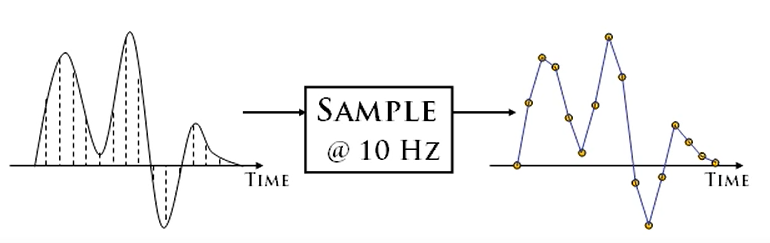

이미지 출처 : https://www.youtube.com/watch?v=zC5KFnSUPNo&t=181s


librosa라는 라이브러리를 이용해서 손쉽게 음원을 수치화 할 수 있습니다. 레게 장르의 한 음원을 살펴보면 이 음원은 22050hz로 샘플링이 되어 있으며 모든 샘플들의 수는 661794개라는 것을 알 수 있습니다. 또한 이 음원의 길이는 샘플의 수를 샘플링 주파수로 나누어주면 쉽게 구할 수 있습니다.

In [2]:
import librosa
# y : audio time series, sr : sampling rate of y
y , sr = librosa.load('Data/genres_original/reggae/reggae.00036.wav')

print(y)
print(len(y))
print(f'Sampling rate (Hz): {sr}')
# 음악의 길이(초) = 음파의 길이/Sampling rate
print(f'Audio length (seconds): {(len(y) / sr)}')

[0.02072144 0.04492188 0.05422974 ... 0.06912231 0.08303833 0.08572388]
661794
Sampling rate (Hz): 22050
Audio length (seconds): 30.013333333333332


### 2-2. 오디오 들어보기
오디오 파일을 소리로 출력하기 위한 Ipython 내장 라이브러리를 사용합니다.

In [3]:
import IPython.display as ipd
ipd.Audio(y, rate=sr)

### 2-3. 음파의 파형
librosa의 display 메소드를 활용해서 waveform을 손쉽게 그려줄 수 있습니다. 그래프의 x축은 음원의 시간이고, y축은 진폭을 나타냅니다. 진폭은 waveform이 가지고 있는 에너지의 값으로 소리의 크기를 의미한다고 이해하면 될 것 같습니다. librosa로 구현한 음파의 이미지는 위에서 알게된 샘플링 주파수sampling rate의 파형과는 달라보이지만 이 음파를 확대해보면 위아래로 진동하는 형태의 파형을 관찰할 수 있습니다.

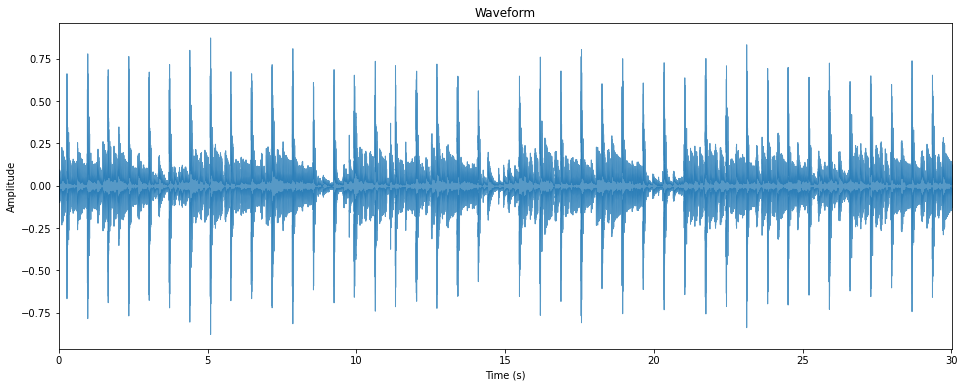

In [4]:
import matplotlib.pyplot as plt
import librosa.display

plt.figure(figsize =(16,6))
librosa.display.waveplot(y=y,sr=sr, alpha=0.75)
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.title("Waveform")
plt.show()

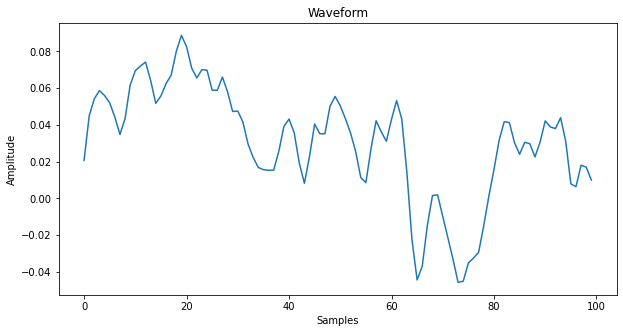

In [5]:
import numpy as np
plt.figure(figsize =(10,5))
plt.plot(np.arange(100), y[0:100])
plt.xlabel("Samples")
plt.ylabel("Amplitude")
plt.title("Waveform")
plt.show()

### 2-4. 푸리에 변환 Fourier Transform
Audio 신호는 차원이 매우 크고 한 신호에도 서로 다른 여러 주파수frequnecy, 예를 들면 다양한 악기의 소리들이 결합되어 있어 음파waveform에서 특징feature를 뽑아내기가 어렵습니다. 푸리에 변환은 신호를 서로 다른 주파수들의 합으로 표현해, 음파를 time domain에서 frequency domain으로 변환시켜 줍니다. 이를 통해 아무리 복잡한 신호라도 각각의 frequency에서 해석이 가능해지게 됩니다.

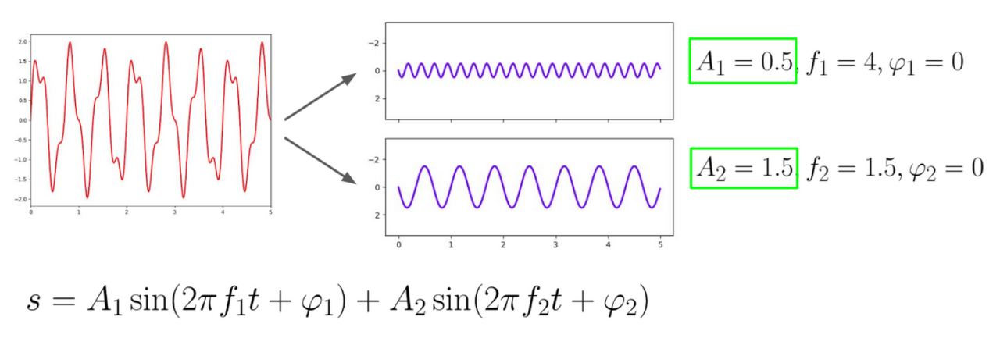

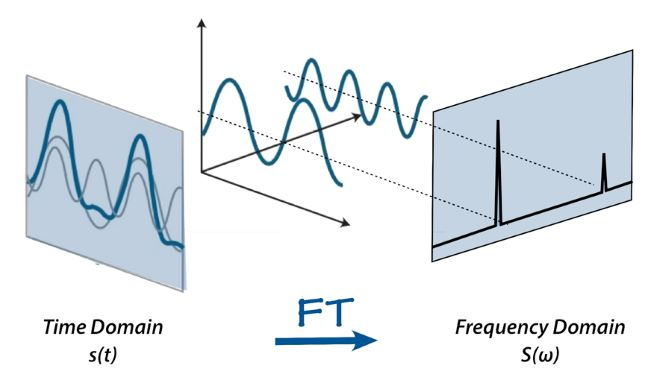

이미지 출처 : https://aavos.eu/glossary/fourier-transform/

(단순 푸리에 변환) 푸리에 변환의 결과값은 복소공간에 형성이 되기 때문에 이 값에 절대값을 취해서 신호의 크기magnitude로 사용하게 됩니다. numpy에는 fft라는 단순 푸리에 변환을 도와주는 메소드가 있습니다. 여기서 단순 푸리에 변환은 현재의 음악 신호를 주파수와 신호의 크기를 기준으로 다시 정렬하는 방법입니다. 이 변환을 거친 그래프는 x축이 주파수, y축이 진폭 혹은 크기인 형태가 되며 이러한 그래프를 스펙트럼spectrum이라고 부릅니다.

Text(0.5, 1.0, 'Spectrum')

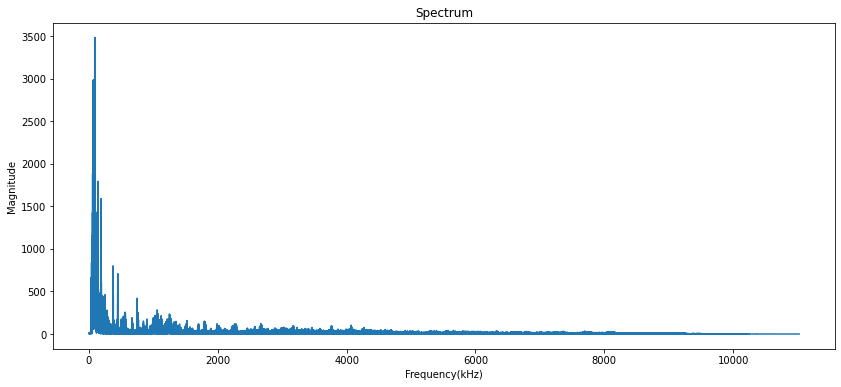

In [6]:
fft = np.fft.fft(y)

# 복소공간 값 절댓갑 취해서, magnitude 구하기
magnitude = np.abs(fft) 

# Frequency 값 만들기
f = np.linspace(0,sr,len(magnitude))

# 푸리에 변환을 통과한 specturm은 대칭구조로 나와서 high frequency 부분 절반을 날려고 앞쪽 절반만 사용한다.
left_spectrum = magnitude[:int(len(magnitude)/2)]
left_f = f[:int(len(magnitude)/2)]

plt.figure(figsize=(14,6))
plt.plot(left_f, left_spectrum)
plt.xlabel("Frequency(kHz)")
plt.ylabel("Magnitude")
plt.title("Spectrum")

(단순 푸리에 변환)librosa의 stft라는 메소드를 사용하면 단순 푸리에 변환을 좀더 간편하게 그려낼 수 있습니다.

(1025, 1293)


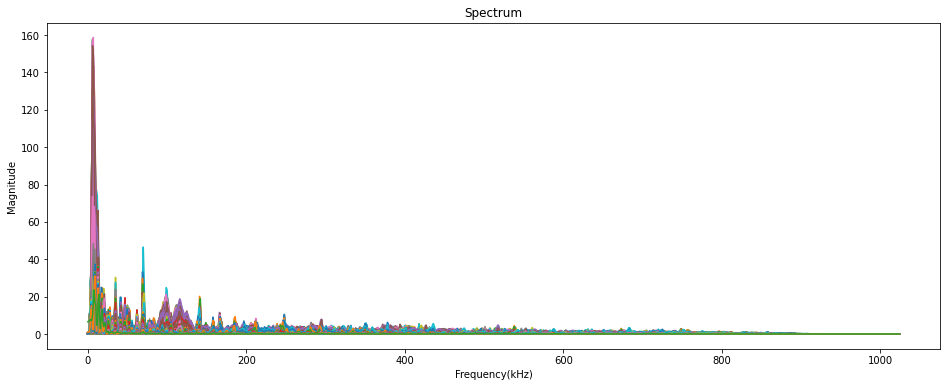

In [7]:
# y : input signal
# n_fft : length of the windowed signal, 음성의 길이를 특정 크기만큼 잘라서 푸리에 변환을 합니다. 
# 일반적으로 22050Hz로 샘플된 오디오의 경우 2048을 사용합니다.
# hop_length : 전체 window frame의 수
# 일반적으로 n_fft // 4의 값을 사용합니다.
# stft에 대한 자세한 설명은 아래에서 이어집니다.
magnitude = np.abs(librosa.stft(y, n_fft=2048, hop_length=512))

print(magnitude.shape)

plt.figure(figsize=(16,6))
plt.xlabel("Frequency(kHz)")
plt.ylabel("Magnitude")
plt.title("Spectrum")
plt.plot(magnitude)
plt.show()

### 2-5.국소 푸리에 변환 Short-time Fourier Transform
앞서 단순 푸리에 변환은 특정 주파수와 신호의 크기와의 관계를 보여줄 수는 있었지만 시간이 흐름에 따라 음악의 주파수가 변하는 것을 확인할 수는 없었습니다. 이때 국소 푸리에 변환 Short-time Fourier Transform(STFT)를 사용하면 시간이 변함에 따라 주파수가 변해가는 정보를 그래프로 그려낼 수 있게 됩니다. STFT는 frame단위로 빠른 푸리에 변환fast Fourier transform(FFT) 알고리듬을 수행함으로써 시간 정보를 보존하게 됩니다. 이러한 그래프를 스펙트로그램spectrogram이라고 부르며, x축이 시간, y축이 주파수, z축은 데시벨db이 됩니다. 사람의 청력은 음원의 크기를 로그log적으로 듣기 때문에 스펙트로그램에서는 신호의 크기magnitude를 데시벨db로 바꾸어서 사용하게 됩니다.

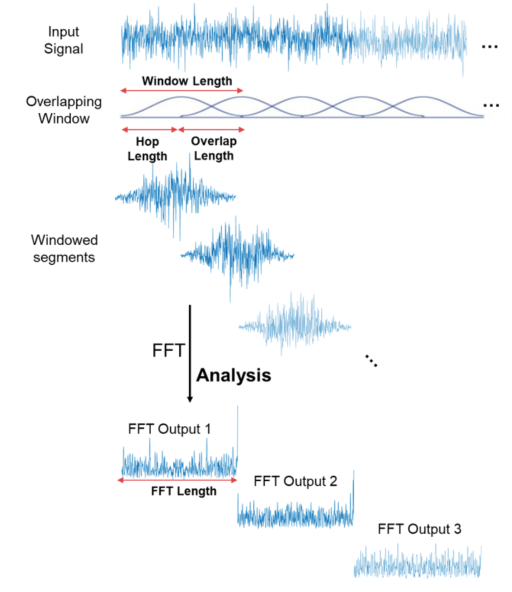

이미지 출처 : https://medium.com/analytics-vidhya/understanding-the-mel-spectrogram-fca2afa2ce53

Text(0.5, 1.0, 'Spectrogram (dB)')

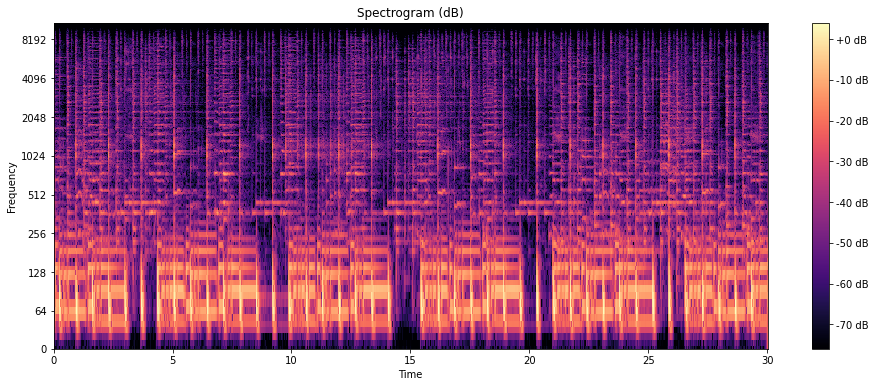

In [8]:
# STFT -> spectrogram
hop_length = 512  # 전체 frame 수와 동일
n_fft = 2048  # frame 하나당 sample 수

# STFT로 변환해주기
stft = librosa.stft(y, n_fft=n_fft, hop_length=hop_length)

# 복소공간 값 절댓값 취하기
magnitude = np.abs(stft)

# magnitude > Decibels 
log_spectrogram = librosa.amplitude_to_db(magnitude, ref=100)

# display spectrogram
plt.figure(figsize=(16,6))
librosa.display.specshow(log_spectrogram, sr=sr, hop_length=hop_length, x_axis='time', y_axis='log')
plt.xlabel("Time")
plt.ylabel("Frequency")
plt.colorbar(format="%+2.0f dB")
plt.title("Spectrogram (dB)")

### 2-6. 클래식 음악과의 비교
레게 음악과 클래식 음악을 비교해보면 레게 음악이 상대적으로 더 리드미컬rhythmical하다는 것을 그래프에서도 끊어지는 부분들을 통해서 확인할 수 있습니다. 또한 레게 음악에서 퍼커션이 담당하고 있는 50-250hz 대의 저음역대가 db으로 보았을 때 그 비중이 상당히 크다는 것을 알 수 있습니다. 이에 비해서 클래식 음악에서는 낮은 음역대의 소리를 담당하는 현악기의 소리의 크기는 250-500hz 대에 좀더 집중되어 있음을 확인할 수 있습니다.

In [9]:
import IPython.display as ipd

yc, sr = librosa.load('Data/genres_original/classical/classical.00036.wav')
ipd.Audio(yc, rate=sr)

Text(0.5, 1.0, 'Spectrogram (dB)')

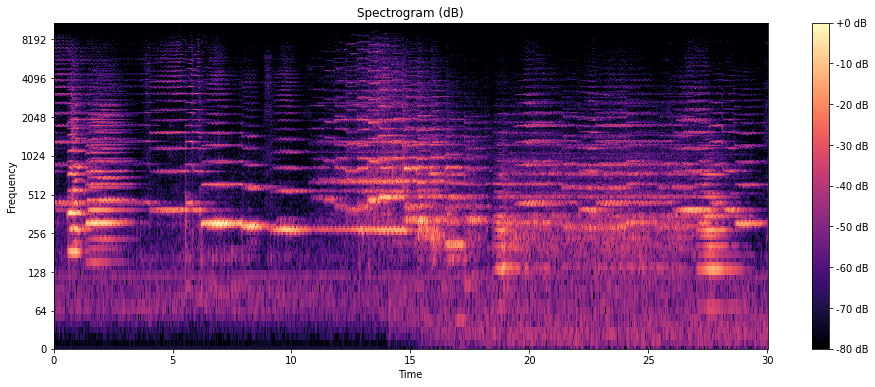

In [ ]:
# STFT -> spectrogram
hop_length = 512  # 전체 frame 수
n_fft = 2048  # frame 하나당 sample 수

# calculate duration hop length and window in seconds
hop_length_duration = float(hop_length)/sr
n_fft_duration = float(n_fft)/sr

# STFT
stft = librosa.stft(yc, n_fft=n_fft, hop_length=hop_length)

# 복소공간 값 절댓값 취하기
magnitude = np.abs(stft)

# magnitude > Decibels 
log_spectrogram = librosa.amplitude_to_db(magnitude, ref=np.max)

# display spectrogram
plt.figure(figsize=(16,6))
librosa.display.specshow(log_spectrogram, sr=sr, hop_length=hop_length, x_axis='time', y_axis='log')
plt.xlabel("Time")
plt.ylabel("Frequency")
plt.colorbar(format="%+2.0f dB")
plt.title("Spectrogram (dB)")

### 2-7. 멜 스펙트로그램 Mel Spectrogram
멜 스펙트로그램이란 주파수의 단위를 아래의 공식에 따라 멜 단위(Mel unit)으로 바꾼 스펙트로그램입니다. 멜 단위는 사람이 인지하기 좋은 스케일scale로 구상이 되었기 때문에 일반적으로 스펙트로그램의 주파수는 이 필터를 적용하는 것이 좀더 활용도가 있습니다. librosa의 feature 메소드를 사용하면 쉽게 멜 스펙토그램을 구할 수 있습니다.

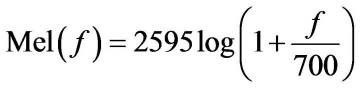

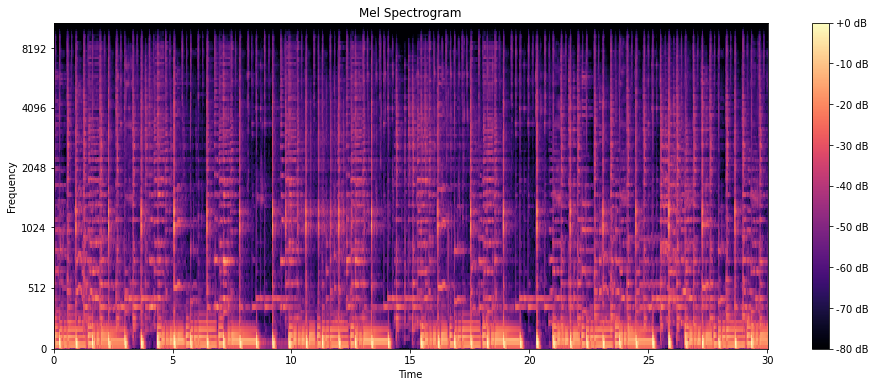

In [ ]:
# 멜 스펙토그램을 구한뒤 magnitude를 db로 바꾸어 준다.
mel_spect = librosa.feature.melspectrogram(y, sr=sr)
mel_spect_db = librosa.power_to_db(mel_spect, ref=np.max)

# display spectrogram
plt.figure(figsize=(16,6))
librosa.display.specshow(mel_spect_db, x_axis='time', y_axis='mel')
plt.xlabel("Time")
plt.ylabel("Frequency")
plt.colorbar(format="%+2.0f dB")
plt.title("Mel Spectrogram")
plt.show()

## 3. 오디오 특징 추출(Audio Feature Extraction)
지금까지 우리는 오디오 데이터를 수치적 데이터로 샘플링 하는 과정을 거쳐서 푸리에 변환을 통해 오디오 데이터를 시각화하는 방법을 배웠습니다. 단순 파형에서 스펙트럼, 스펙트로그램의 그래프를 확인하면서 음원이 가진 특징을 눈으로 확인할 수 있었습니다. 지금부터는 기계학습에 활용할 수 있는 오디오의 특징feature을 추출하는 다양한 방법들을 살펴보려고 합니다. 오디오의 특징은 이제 특정한 방법에 의해 계산된 숫자로 표현이 됩니다.

### 3-1. Tempo(BPM)
librosa의 beat 메소드를 이용하면 음원의 템포와 리듬을 일정하게 나눈 구간인 비트를 구할 수 있습니다. 하지만 이는 정확한 값이 아니기에 참고를 하는 수준에서 넘어가도 좋을 것 같습니다.

In [ ]:
tempo, beats = librosa.beat.beat_track(y,sr=sr)     
print(tempo)
print(beats)

86.1328125
[  12   42   72  101  131  160  190  220  249  279  309  339  369  398
  428  458  488  518  548  577  607  637  667  697  727  757  787  816
  846  876  906  936  967  996 1027 1056 1086 1116 1146 1175 1206 1235]


In [ ]:
tempo, beats = librosa.beat.beat_track(yc,sr=sr)     
print(tempo)
print(beats)

107.666015625
[   5   28   50   72   96  120  144  169  195  217  240  263  289  314
  338  362  387  413  438  463  487  510  535  559  583  608  634  661
  686  708  733  757  783  805  829  853  876  901  925  950  974  998
 1022 1047 1071 1096 1119 1144]


### 3-2. Zero Crossing Rate
Zero Crossing Rate(ZCR)은 신호가 양에서 음, 음에서 양으로 즉 0을 지나는 비율을 의미합니다. ZCR은 간단해보이지만 퍼커션 사운드를 구분해내는데 유의미한 특징feature을 만들어내기 때문에 음성과 음원 구분에서 자주 사용이 됩니다. ZCR은 librosa를 이용해서 쉽게 구할 수 있습니다.

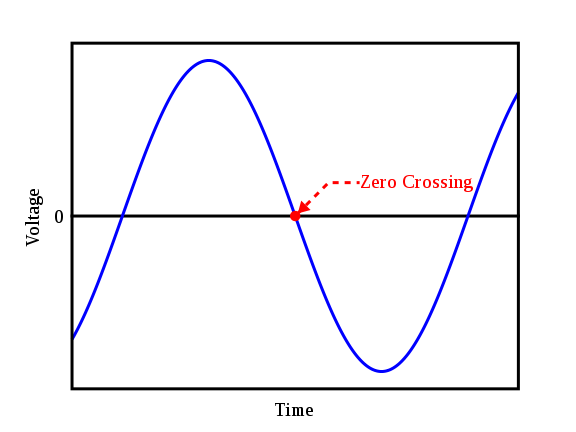

이미지 출처 : https://www.analyticsvidhya.com/blog/2022/01/analysis-of-zero-crossing-rates-of-different-music-genre-tracks/

In [ ]:
# 레게 음악의 zero crossing rate를 구합니다.
zero_crossings = librosa.zero_crossings(y, pad=False)

print(zero_crossings)
print(sum(zero_crossings))

[False False False ... False False False]
39405


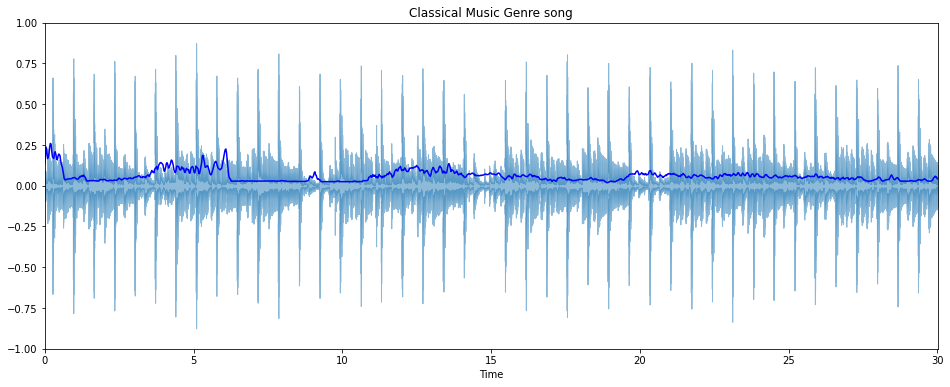

In [ ]:
# 클래식 음악의 zero crossing rate를 음파와 비교해봅니다.
zcr_classical = librosa.feature.zero_crossing_rate(yc, frame_length=2048, hop_length=512)[0]

# x축에 시간 단위를 넣기 위해서 frame을 time으로 바꾸어 줍니다.
frames = range(len(zcr_classical))
t = librosa.frames_to_time(frames, hop_length=512)

plt.figure(figsize=(16,6))
librosa.display.waveplot(y, alpha=0.5)
plt.plot(t, zcr_classical, color="b")
plt.ylim((-1, 1))
plt.title("Classical Music Genre song")
plt.show()

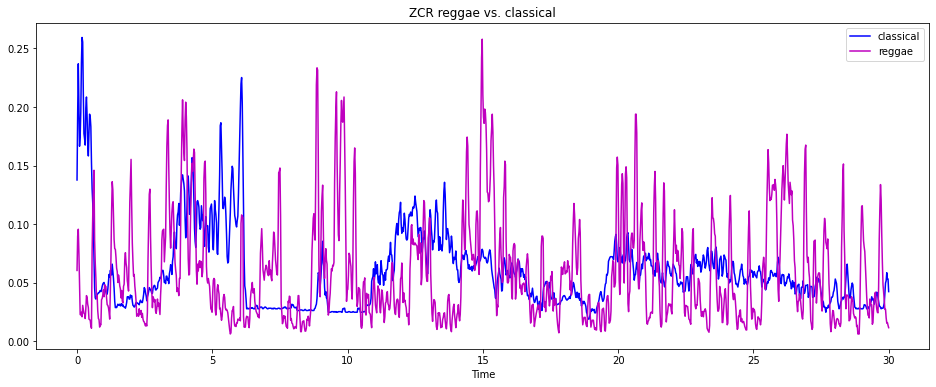

In [ ]:
# 레게 음악과 클래식 음악을 비교해보면 레게 음악의 zcr이 좀더 두드러집니다.
zcr_reggae = librosa.feature.zero_crossing_rate(y, frame_length=2048, hop_length=512)[0]

plt.figure(figsize=(16, 6))
plt.plot(t, zcr_classical, color="b", label="classical")
plt.plot(t, zcr_reggae, color="m", label="reggae")
plt.xlabel("Time")
plt.title("ZCR reggae vs. classical")
plt.legend()
plt.show()

### 3-3. Harmonic and Percussive Components(HPS)
HPS의 목적은 주어진 음원을 퍼커션 파트와 퍼커션 파트를 제외한 소리의 두 가지 부분으로 나누는 것입니다. librosa의 effects 메소드를 이용하면 이를 쉽게 구현할 수 있습니다.

In [10]:
yz, sr = librosa.load('Data/genres_original/jazz/jazz.00005.wav')
ipd.Audio(yz, rate=sr)

In [11]:
# data_h : 퍼커션 파트를 제외한 소리, data_p : 퍼커션 파트
data_h, data_p = librosa.effects.hpss(yz)
# 멜 스펙토그램을 구해줍니다.
spec_h = librosa.feature.melspectrogram(data_h, sr=sr)
spec_p = librosa.feature.melspectrogram(data_p, sr=sr)
# magnitude를 db로 바꾸어줍니다.
db_spec_h = librosa.power_to_db(spec_h,ref=np.max)
db_spec_p = librosa.power_to_db(spec_p,ref=np.max)

In [12]:
# 퍼커션 위주의 소리가 남았습니다.
ipd.Audio(data_p,rate=sr) 

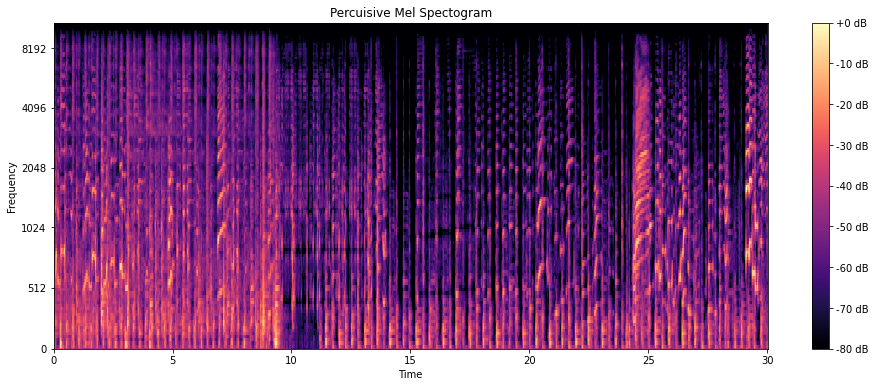

In [ ]:
plt.figure(figsize=(16,6))
librosa.display.specshow(db_spec_p, x_axis='time', y_axis='mel')
plt.xlabel("Time")
plt.ylabel("Frequency")
plt.colorbar(format="%+2.0f dB")
plt.title("Percuisive Mel Spectogram")
plt.show()

In [13]:
# 퍼커션의 소리가 거의 사라진 것을 확인할 수 있습니다.
ipd.Audio(data_h,rate=sr) 

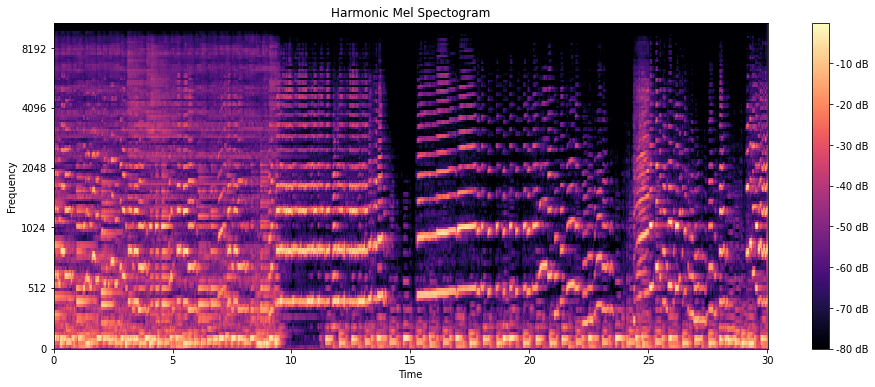

In [ ]:
plt.figure(figsize=(16,6))
librosa.display.specshow(db_spec_h, x_axis='time', y_axis='mel')
plt.xlabel("Time")
plt.ylabel("Frequency")
plt.colorbar(format="%+2.0f dB")
plt.title("Harmonic Mel Spectogram")
plt.show()

### 3-4.스펙트럼 중심Spectral Centroid
스펙트럼 중심은 오디오 신호 처리에서 스펙트럼spectrum을 특성화 하는 측정값 중에 하나입니다. 이 중심값은 주파수의 가중치의 평균값weighted mean을 계산함으로써 얻어집니다. 일반적으로 중심값이 높을 수록 높은 주파수에서 선명한 음질을 나타내게 됩니다. 따라서 오디오 분류 작업에서 좋은 효과를 만들 수 있는 특징값입니다. 스펙트럼 중심은 librosa의 feature 메소드를 이용해서 쉽게 구할 수 있습니다.

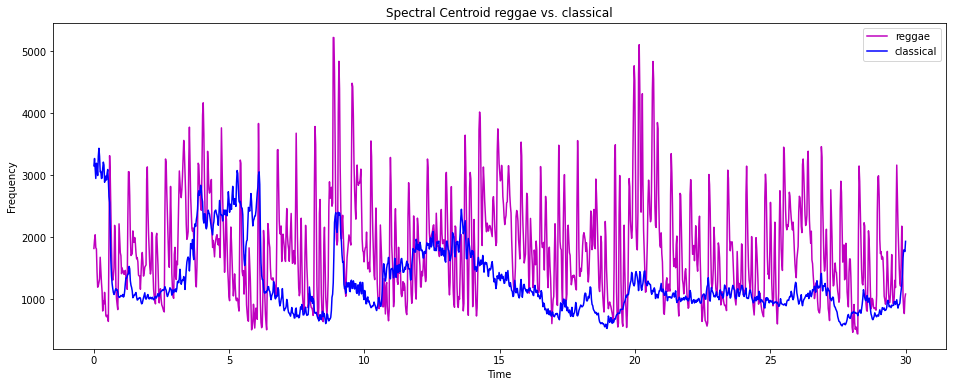

In [ ]:
# 레게 음악과 클래식 음악의 스펙트럼 중심을 구합니다.
sc_reggae = librosa.feature.spectral_centroid(y, sr=sr)[0]
sc_classical = librosa.feature.spectral_centroid(yc, sr=sr)[0]

# x축에 시간 단위를 넣기 위해서 frame을 time으로 바꾸어 줍니다.
frames = range(len(sc_reggae))
t = librosa.frames_to_time(frames, hop_length=512)

plt.figure(figsize=(16,6))
plt.plot(t, sc_reggae, color='m', label="reggae")
plt.plot(t, sc_classical, color='b', label='classical')
plt.xlabel("Time")
plt.ylabel("Frequency")
plt.title("Spectral Centroid reggae vs. classical")
plt.legend()
plt.show()


### 3-5. Spectral Rolloff
Spectral Rolloff는 음성 구간과 무 음성 구간 사이를 구분하는 특징으로써 중심값centroid와 함께 스펙트럼 형태의 또 다른 측정 방법입니다. 이 값은 스펙트럼에서 소리의 크기magnitude의 분포의 85% 이하가 집중해 있는 주파수 이하의 값들입니다.

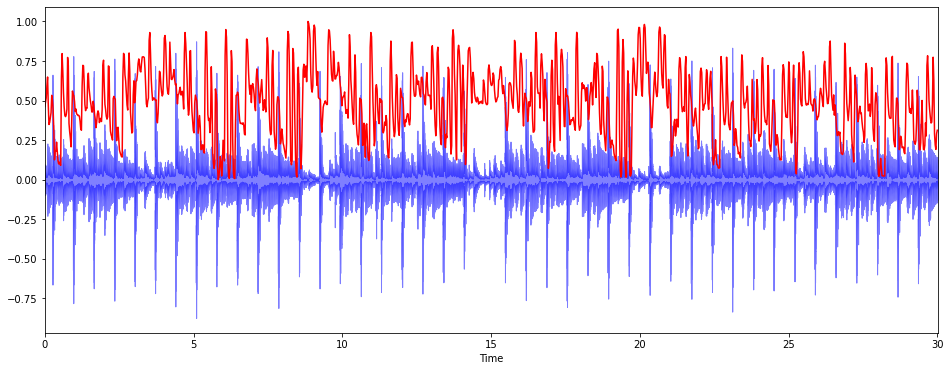

In [ ]:
import sklearn
def normalize(x, axis=0):
  return sklearn.preprocessing.minmax_scale(x, axis=axis)    #sk.minmax_scale() : 최대 최소를 0 ~ 1 로 맞춰준다.

spectral_rolloff = librosa.feature.spectral_rolloff(y, sr=sr)[0]

plt.figure(figsize=(16,6))
librosa.display.waveplot(y,sr=sr,alpha=0.5,color='b')
plt.plot(t, normalize(spectral_rolloff),color='r')
plt.show()

### 3-6. Mel-Frequency Cepstral Coefficients(MFCCs)
MFCC는 음성 또는 오디오 신호가 가지고 있는 어떠한 특징을 뽑아내는 과정feature extraction입니다.  MFCC의 특징은 그 결과값이 오디오가 가진 특징을 잘 표현하면서도 데이터의 양이 적은 특징 벡터feature vector로 만들어진다는 것입니다. MFCC는 스펙트럼spectrum에 멜 필터Mel-filter를 적용한 멜 스펙트럼Mel-spectrum을 켑스트럴cepstral 분석을 통해 추출한 값입니다. 이 과정은 이 글에서 설명하기에 복잡하기 때문에 더 자세한 설명을 위해서는 아래의 링크를 참고하시길 추천드립니다. librosa의 feature 메소드를 이용하면 MFCC를 쉽게 구할 수 있습니다.

reference :  
https://newsight.tistory.com/294  
https://sanghyu.tistory.com/45

mean: 0.50
var: 0.03


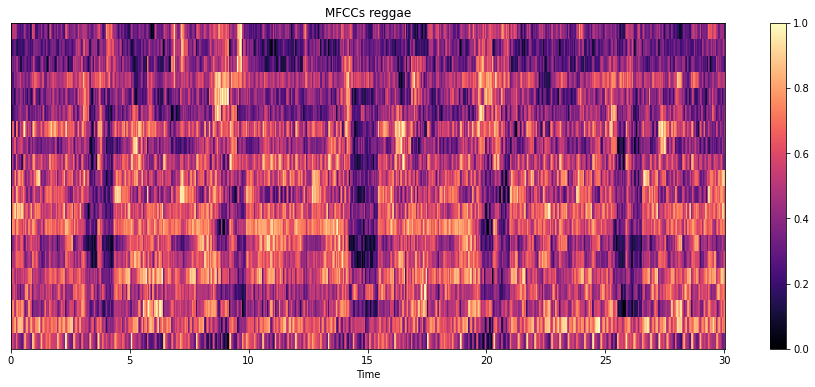

In [ ]:
mfccs = librosa.feature.mfcc(y, sr=sr)
mfccs = normalize(mfccs,axis=1)

print('mean: %.2f' % mfccs.mean())
print('var: %.2f' % mfccs.var())

plt.figure(figsize=(16,6))
librosa.display.specshow(mfccs,sr=sr, x_axis='time')
plt.xlabel("Time")
plt.colorbar()
plt.title("MFCCs reggae")
plt.show()

mean: 0.48
var: 0.04


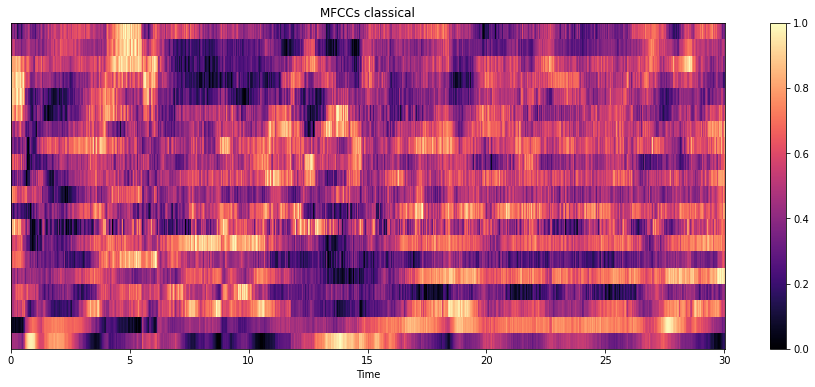

In [ ]:
mfccs = librosa.feature.mfcc(yc, sr=sr)
mfccs = normalize(mfccs,axis=1)

print('mean: %.2f' % mfccs.mean())
print('var: %.2f' % mfccs.var())

plt.figure(figsize=(16,6))
librosa.display.specshow(mfccs,sr=sr, x_axis='time')
plt.xlabel("Time")
plt.colorbar()
plt.title("MFCCs classical")
plt.show()

mean: 0.48
var: 0.03


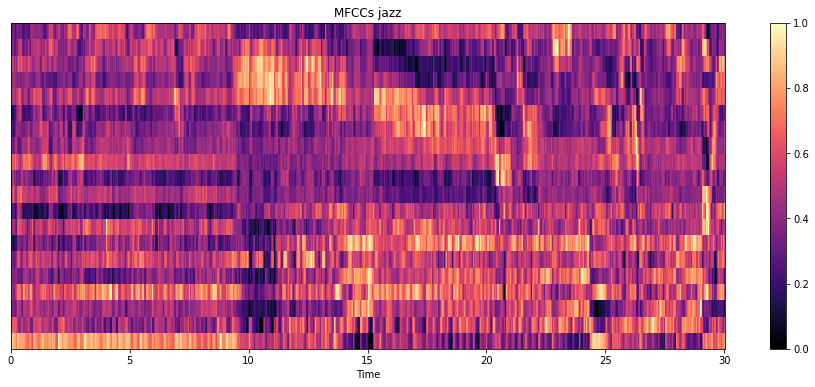

In [ ]:
mfccs = librosa.feature.mfcc(yz, sr=sr)
mfccs = normalize(mfccs,axis=1)

print('mean: %.2f' % mfccs.mean())
print('var: %.2f' % mfccs.var())

plt.figure(figsize=(16,6))
librosa.display.specshow(mfccs,sr=sr, x_axis='time')
plt.xlabel("Time")
plt.colorbar()
plt.title("MFCCs jazz")
plt.show()

### 3-7. Chroma Frequencies
크로마 벡터chroma vector는 서양 음악의 12음계를 바탕으로 특정 시간에 존재하는 에너지 정보를 12차원의 벡터값으로 표현한 것입니다. chroma vector를 통해서 오디오의 화성적인 진행을 알아볼 수 있습니다. librosa의 chroma_stft는 stft를 활용해서 각각의 frame별로 chroma의 값을 계산한뒤 chromagram으로 만들어주는 메소드입니다.

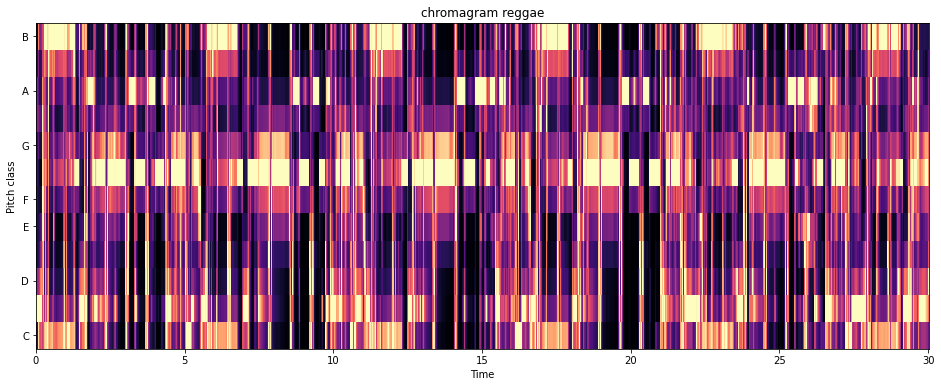

In [ ]:
chromagram = librosa.feature.chroma_stft(y, sr=sr, hop_length=512)

plt.figure(figsize=(16,6))
librosa.display.specshow(chromagram,x_axis='time', y_axis='chroma', hop_length=512)
plt.title('chromagram reggae')
plt.show()

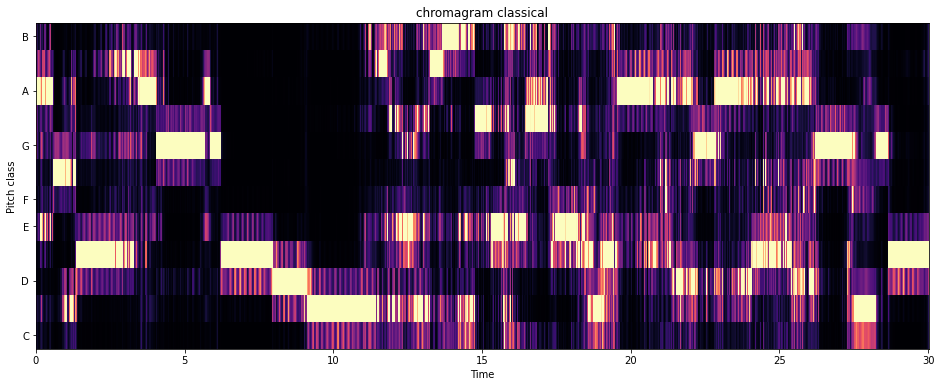

In [ ]:
chromagram = librosa.feature.chroma_stft(yc, sr=sr, hop_length=512)

plt.figure(figsize=(16,6))
librosa.display.specshow(chromagram,x_axis='time', y_axis='chroma', hop_length=512)
plt.title('chromagram classical')
plt.show()

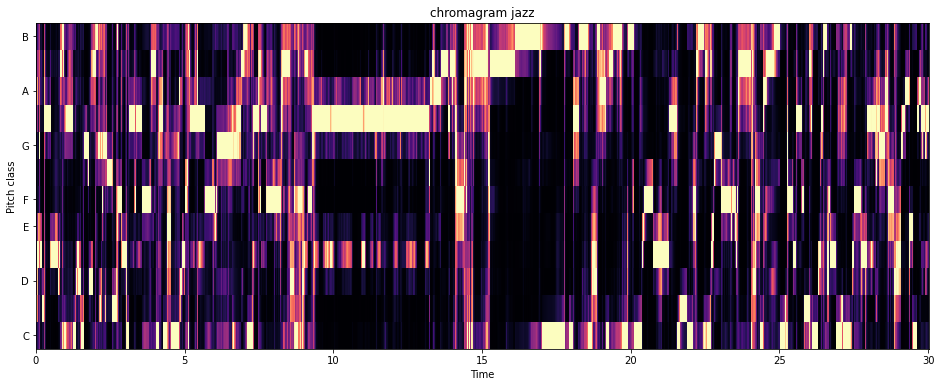

In [ ]:
chromagram = librosa.feature.chroma_stft(yz, sr=sr, hop_length=512)

plt.figure(figsize=(16,6))
librosa.display.specshow(chromagram,x_axis='time', y_axis='chroma', hop_length=512)
plt.title('chromagram jazz')
plt.show()

## 4. 음악 장르 분류 알고리즘
우리는 지금까지 음악의 장르를 분류하기 위한 특징feature을 추출하는 다양한 방법들을 살펴보았습니다. 이러한 특징들을 어떻게 조합하고, 사용하는 것이 음악 장르를 분류하는 데에 최적의 결과를 내는 것인지는 계속해서 연구되고 있습니다. 지금은 앞서 살펴본 chroma_stft, spectral_centroid, mfcc등의 특징값들이 오디오별로 평균과 분산값으로 정리되어 있는 csv 파일을 사용해서 머신러닝 모델을 만들어보도록 하겠습니다.

### 4-1. 데이터 로드
features_3_sec.csv 파일에는 오디오 파일별로 미리 추출된 특징들이 정리되어 있습니다. 하지만 이 오디오들은 기존의 30초짜리 음원을 3초 단위로 잘라서 10분할을 한 오디오 파일들로 이 방식으로 데이터의 양을 약 10배가량 늘렸습니다. 데이터와 관련해서는 일반적으로 그 양이 많은 편이 학습에 더 유리하게 작용합니다.

In [14]:
import pandas as pd

df = pd.read_csv('Data/features_3_sec.csv')

df.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.0.wav,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,...,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,blues
1,blues.00000.1.wav,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,...,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,blues
2,blues.00000.2.wav,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,...,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,blues
3,blues.00000.3.wav,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,...,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,blues
4,blues.00000.4.wav,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,...,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,blues


### 4-2. 전처리
불필요한 열을 제거하고, sklearn의 preprocessing 메소드를 이용해서 특징값들을 스케일을 해줍니다. 이렇게 함으로써 학습시에 특정 값들이 너무 큰 비중을 차지하게 되는 것을 막아줄 수 있습니다.

In [21]:
import sklearn

X = df.drop(columns=['filename','length','label']) 
y = df['label']

scaler = sklearn.preprocessing.MinMaxScaler()
np_scaled = scaler.fit_transform(X)

X = pd.DataFrame(np_scaled, columns=X.columns)

X.head()

,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,...,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var
0,0.355399,0.716757,0.293133,0.107955,0.262173,0.034784,0.459205,0.094130,0.346153,0.083164,...,0.363613,0.056198,0.397172,0.066062,0.371828,0.055344,0.380831,0.026797,0.506746,0.047781
1,0.367322,0.670347,0.253040,0.044447,0.270969,0.018716,0.470831,0.052261,0.363722,0.051694,...,0.468596,0.092912,0.351681,0.074001,0.362068,0.076365,0.418452,0.082414,0.593029,0.065548
2,0.373159,0.728067,0.296753,0.141663,0.265293,0.023073,0.494051,0.059922,0.378215,0.060820,...,0.479681,0.096704,0.420979,0.050639,0.400536,0.067509,0.433742,0.043841,0.546264,0.036062
3,0.399349,0.677066,0.298024,0.075042,0.238427,0.023187,0.455246,0.066234,0.329587,0.070906,...,0.386258,0.067995,0.387474,0.050617,0.380430,0.050030,0.405824,0.041898,0.562204,0.034873
4,0.355668,0.689113,0.322308,0.052149,0.233460,0.016451,0.451651,0.047830,0.318453,0.046916,...,0.438567,0.042500,0.460314,0.083860,0.388590,0.076524,0.409019,0.020763,0.517913,0.031713


### 4-3. 데이터셋 분할
데이터에서 20% 가량은 테스트 용도로 분리를 해줍니다. 테스트용 데이터는 이 모델의 실질적인 성능을 체크할 수 있도록 학습이 아닌 검증에만 사용할 수 있어야 합니다.

In [17]:
from sklearn.model_selection import train_test_split

X_train , X_test , y_train, y_test = train_test_split(X,y , test_size=0.2, random_state=2022)

print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(7992, 57) (7992,)
(1998, 57) (1998,)


### 4-4. 학습 및 검증
머신러닝 모델로는 확률적 경사하강법을 사용하는 분류 모델인 SGD classifier를 사용하였습니다. cross_validate를 사용해서 train 데이터셋을 교차 검증을 하였고, test 데이터셋에서는 0.65라는 정확도를 얻을 수 있었습니다.

In [ ]:
from sklearn.linear_model import SGDClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_validate

sgdc = SGDClassifier(max_iter=10000)

scores = cross_validate(sgdc, X_train, y_train)
print(f"fit_time : {scores['fit_time']}")
print(f"score_time : {scores['score_time']}")
print(f"test_score : {scores['test_score']}")

sgdc.fit(X_train, y_train)
pred = sgdc.predict(X_test)
accuracy = accuracy_score(y_test , pred)

print(f"Test data Accuracy : {accuracy:.2f}")

fit_time : [0.66984558 0.53464365 0.57394552 0.62705684 0.51155496]
score_time : [0.02131009 0.00849152 0.01102471 0.006464   0.00549078]
test_score : [0.66979362 0.6435272  0.61013767 0.640801   0.67459324]
Test data Accuracy : 0.65


In [20]:
from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_validate

lgbm_wrapper = LGBMClassifier(n_estimators=400)
'''
scores = cross_validate(lgbm_wrapper, X_train, y_train)
print(f"fit_time : {scores['fit_time']}")
print(f"score_time : {scores['score_time']}")
print(f"test_score : {scores['test_score']}")
'''

lgbm_wrapper.fit(X_train, y_train)
pred = lgbm_wrapper.predict(X_test)
accuracy = accuracy_score(y_test , pred)

print(f"Test data Accuracy : {accuracy:.2f}")

Test data Accuracy : 0.93


### 5. (probelm)더 나은 성능을 달성하기 위한 방법을 찾기
지금까지 csv 데이터셋을 간단하게 처리 해서 SGD classifier 모델을 학습을 시키고 test 데이터셋에서 최종 검증을 해보았습니다. 정확도 65%는 오디오에서 특징값feature들을 추출한 노력을 감안했을때 그리 높은 수치는 아닌데요. 여러분은 이 test 데이터셋에서의 정확도를 높이는 것을 목표로 다양한 방법을 시도해보셨으면 좋겠습니다.

#### (hint)
* 앙상블 학습을 시도해보세요. random forest classifier나 XGBoost, LightGBM과 같은 앙상블 알고리즘은 매우 뛰어난 성능을 자랑합니다.
* 최적의 성능을 내는 모델을 찾아서 learning rate나 반복학습의 횟수와 같은 하이퍼 파라미터를 조정해보세요.
* 나아가서 gridsearch를 통해 최적의 하이퍼 파라미터를 찾는 자동화의 방법이나 early stopping과 같은 방법을 활용해서 가능한한 정확도를 끝까지 높여보세요.
* 제가 공부한 내용을 담은 [블로그](https://velog.io/@clayryu328/%ED%98%BC%EC%9E%90-%EA%B3%B5%EB%B6%80%ED%95%98%EB%8A%94-%EB%A8%B8%EC%8B%A0%EB%9F%AC%EB%8B%9D%EB%94%A5%EB%9F%AC%EB%8B%9D-2)입니다. 참고하셔도 좋습니다.